<a href="https://colab.research.google.com/github/juliakarabasova/labs_and_projects/blob/main/Object_Detection_Karabasova.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center> Майнор "Интеллектуальный анализ данных" </center>

# <center> Курс "Современные методы машинного обучения" </center>

# <center> Лабораторная работа №2. Object Detection. </center>

## Data

In [1]:
import pandas as pd
import numpy as np
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import math
import glob
import cv2
import os
import torchvision
import torchvision.transforms as T
import matplotlib.pyplot as plt
from sklearn.metrics import auc

Install library for processing the labeling
```bash
pip install xmltodict
```

In [2]:
!pip install xmltodict

In [3]:
import xmltodict, json

В этом задании потребуется обучить детектор фруктов на изображении. Данные находятся в архиве `data.zip`. Данные уже поделены на train и test.

Датасет для трех классов.

In [4]:
class2tag = {"apple": 1, "orange": 1, "banana": 1}

class FruitDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.images = []
        self.annotations = []
        self.transform = transform
        for annotation in glob.glob(data_dir + "/*xml"):
            image_fname = os.path.splitext(annotation)[0] + ".jpg"
            self.images.append(cv2.cvtColor(cv2.imread(image_fname), cv2.COLOR_BGR2RGB))
            with open(annotation) as f:
                annotation_dict = xmltodict.parse(f.read())
            bboxes = []
            labels = []
            objects = annotation_dict["annotation"]["object"]
            if not isinstance(objects, list):
                objects = [objects]
            for obj in objects:
                bndbox = obj["bndbox"]
                bbox = [bndbox["xmin"], bndbox["ymin"], bndbox["xmax"], bndbox["ymax"]]
                bbox = list(map(int, bbox))
                bboxes.append(torch.tensor(bbox))
                labels.append(class2tag[obj["name"]])
            self.annotations.append(
                {"boxes": torch.stack(bboxes).float(), "labels": torch.tensor(labels)}
            )

    def __getitem__(self, i):
        if self.transform:
            res = self.transform(self.images[i])
            return res, self.annotations[i]
        else:
            return self.images[i], self.annotations[i]

    def __len__(self):
        return len(self.images)

In [5]:
def get_transform():
    transforms = []
    transforms.append(T.ToTensor())
    return T.Compose(transforms)

<br>  
<br>  
Функции для вычисления mAP.

In [79]:
def intersection_over_union(dt_bbox, gt_bbox):
    """
    Intersection over Union between two bboxes
    :param dt_bbox: list or numpy array of size (4,) [x0, y0, x1, y1]
    :param gt_bbox: list or numpy array of size (4,) [x0, y0, x1, y1]
    :return : intersection over union
    """

    intersection_bbox = np.array(
        [
            max(dt_bbox[0], gt_bbox[0]),
            max(dt_bbox[1], gt_bbox[1]),
            min(dt_bbox[2], gt_bbox[2]),
            min(dt_bbox[3], gt_bbox[3]),
        ]
    )

    intersection_area = max(intersection_bbox[2] - intersection_bbox[0], 0) * max(
        intersection_bbox[3] - intersection_bbox[1], 0
    )
    area_dt = (dt_bbox[2] - dt_bbox[0]) * (dt_bbox[3] - dt_bbox[1])
    area_gt = (gt_bbox[2] - gt_bbox[0]) * (gt_bbox[3] - gt_bbox[1])

    union_area = area_dt + area_gt - intersection_area

    iou = intersection_area / union_area
    return iou

def evaluate_sample(target_pred, target_true, iou_threshold=0.5, score_threshold=0):
    gt_bboxes = target_true["boxes"].numpy()
    gt_labels = target_true["labels"].numpy()

    dt_bboxes = target_pred["boxes"].numpy()
    dt_labels = target_pred["labels"].numpy()
    dt_scores = target_pred["scores"].numpy()

    results = []
    for detection_id in range(len(dt_labels)):
        dt_bbox = dt_bboxes[detection_id, :]
        #dt_label = 1 if dt_labels[detection_id] in correct_inds else 0
        dt_label = dt_labels[detection_id]
        dt_score = dt_scores[detection_id]

        detection_result_dict = {"score": dt_score}

        max_IoU = 0
        max_gt_id = -1
        for gt_id in range(len(gt_labels)):
            gt_bbox = gt_bboxes[gt_id, :]
            gt_label = gt_labels[gt_id]

            if gt_label != dt_label:
                continue

            if intersection_over_union(dt_bbox, gt_bbox) > max_IoU:
                max_IoU = intersection_over_union(dt_bbox, gt_bbox)
                max_gt_id = gt_id

        if max_gt_id >= 0 and max_IoU >= iou_threshold and dt_score > score_threshold:
            detection_result_dict["TP"] = 1
            gt_labels = np.delete(gt_labels, max_gt_id, axis=0)
            gt_bboxes = np.delete(gt_bboxes, max_gt_id, axis=0)

        else:
            detection_result_dict["TP"] = 0

        results.append(detection_result_dict)
    
    if not results:
      results = [{"TP": 0, 'score': 0}]

    return results


def evaluate(model, test_loader, device, iou_threshold=0.5, score_threshold=0):
    results = []
    model.eval()
    nbr_boxes = 0
    with torch.no_grad():
        for batch, (images, targets_true) in enumerate(test_loader):
            images = list(image.to(device).float() for image in images)
            targets_pred = model(images)

            targets_true = [
                {k: v.cpu().float() for k, v in t.items()} for t in targets_true
            ]
            targets_pred = [
                {k: v.cpu().float() for k, v in t.items()} for t in targets_pred
            ]

            for i in range(len(targets_true)):
                target_true = targets_true[i]
                target_pred = targets_pred[i]
                nbr_boxes += target_true["labels"].shape[0]

                results.extend(evaluate_sample(target_pred, target_true, iou_threshold, score_threshold))

    results = sorted(results, key=lambda k: k["score"], reverse=True)

    acc_TP = np.zeros(len(results))
    acc_FP = np.zeros(len(results))
    recall = np.zeros(len(results))
    precision = np.zeros(len(results))

    if results[0]["TP"] == 1:
        acc_TP[0] = 1
    else:
        acc_FP[0] = 1

    for i in range(1, len(results)):
        acc_TP[i] = results[i]["TP"] + acc_TP[i - 1]
        acc_FP[i] = (1 - results[i]["TP"]) + acc_FP[i - 1]

        precision[i] = acc_TP[i] / (acc_TP[i] + acc_FP[i])
        recall[i] = acc_TP[i] / nbr_boxes

    return auc(recall, precision), sum(precision)/len(precision), sum(recall)/len(recall)

In [7]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
!unzip /content/drive/MyDrive/data.zip -d /content/data

<br>  
<br>  
  
## Часть 1.  
  
*Вес в общей оценке - 0.4*  
  
В данной части вам нужно решить задачу детектирования фруктов "без классификации". Для этого все три класса нужно объединить в один (нужно внести соотвествующие изменения в датасет).

### Задание 1.  
  
Примените обученные детекторы из [torchvision.models](https://pytorch.org/vision/stable/models.html#object-detection-instance-segmentation-and-person-keypoint-detection) - Faster R-CNN, RetinaNet, SSD (можно только с одним backbone, можно все попробовать) - и оцените качество детекции на тестовом датасете. 

In [64]:
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn, retinanet_resnet50_fpn, ssd300_vgg16

frcnn = fasterrcnn_mobilenet_v3_large_320_fpn(pretrained=True)
retina = retinanet_resnet50_fpn(pretrained=True)
ssd = ssd300_vgg16(pretrained=True)

In [65]:
train_data = FruitDataset('/content/data/train_zip/train', get_transform())
test = FruitDataset('/content/data/test_zip/test', get_transform())

In [14]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [15]:
device

device(type='cuda')

In [ ]:
frcnn.to(device)
frcnn.eval()

retina.to(device)
retina.eval()

ssd.to(device)
ssd.eval()

Посмотрим на примеры предиктов установленных моделей, не обращая внимания на класс

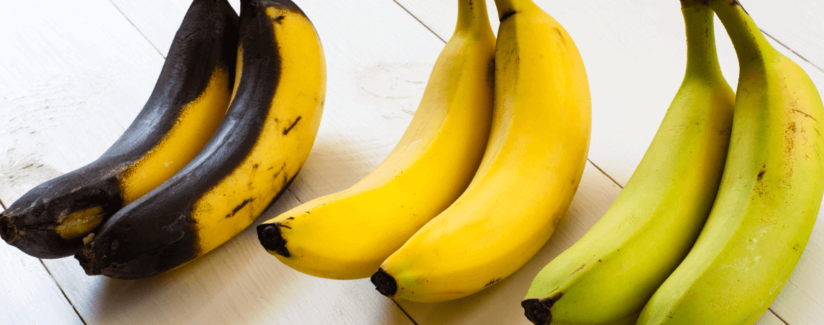

In [28]:
from PIL import ImageDraw

image, labels = test[25]

image = T.ToPILImage()(image)
draw = ImageDraw.Draw(image)
image

In [32]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]
classes = dict(zip(range(len(COCO_INSTANCE_CATEGORY_NAMES)), COCO_INSTANCE_CATEGORY_NAMES))

In [33]:
correct_inds = [COCO_INSTANCE_CATEGORY_NAMES.index('banana'), COCO_INSTANCE_CATEGORY_NAMES.index('apple'), COCO_INSTANCE_CATEGORY_NAMES.index('orange')]
correct_inds

[52, 53, 55]

In [34]:
true_labels = {
               'orange': COCO_INSTANCE_CATEGORY_NAMES.index('orange'),
               'banana': COCO_INSTANCE_CATEGORY_NAMES.index('banana'),
               'apple': COCO_INSTANCE_CATEGORY_NAMES.index('apple')
               }
classes_true = {1: 'apple', 2: 'orange', 3: 'banana'}

Ground Truth


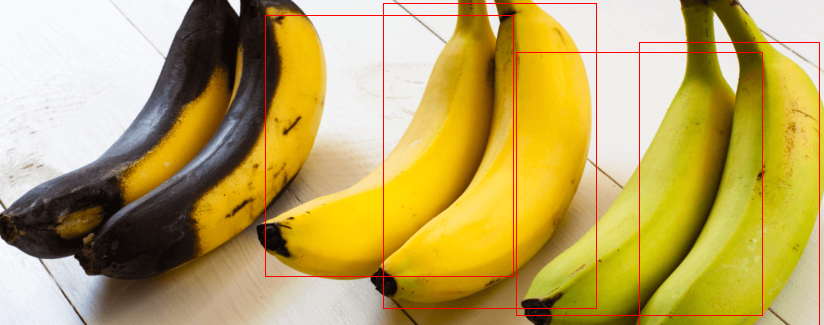

In [43]:
image, labels = test[25]

image = T.ToPILImage()(image)
draw = ImageDraw.Draw(image)
box = labels['boxes']
label = labels['labels']
for i in range(len(labels['labels'])):
  '''draw.text((int(box[i][0]), int(box[i][1])), 
            f"{classes_true[int(label[i].numpy())]}", 
            fill='black')'''
  draw.rectangle([(box[i][0], box[i][1]), (box[i][2], box[i][3])], outline='red')
print('Ground Truth')
image

RetinaNet: 60


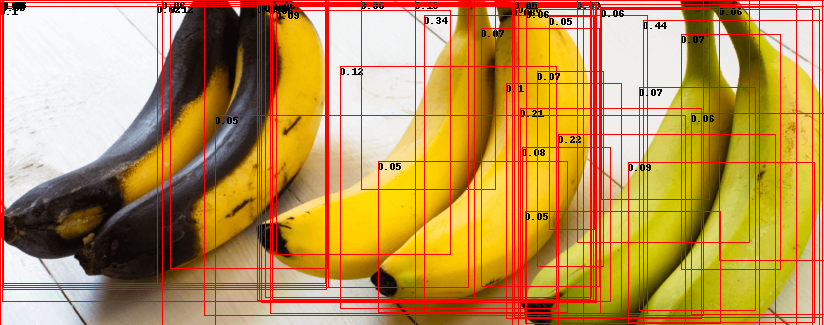

In [35]:
iou_threshold = 0.2

image, labels = test[25]
pred = retina(image.unsqueeze(0).to(device))[0]

image = T.ToPILImage()(image)
draw = ImageDraw.Draw(image)
for box, label, score in zip(pred['boxes'], pred["labels"], pred["scores"]):
    score = round(float(score.cpu().detach().numpy()),2)
    draw.text((box[0], box[1]), f"{str(score)}", fill='black')
    draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
print('RetinaNet:', len(pred["labels"]))
image

SSD:  200


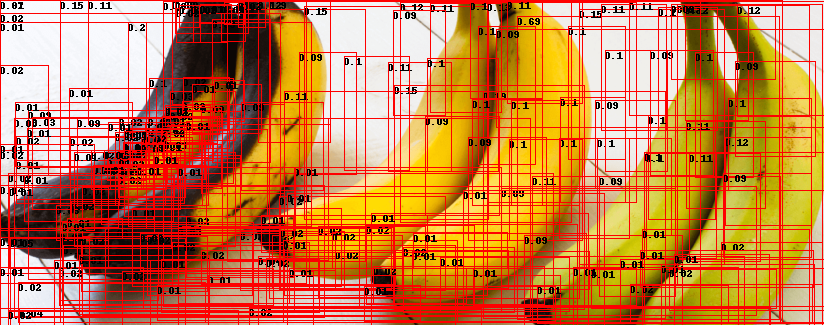

In [36]:
iou_threshold = 0.2

image, labels = test[25]
pred = ssd(image.unsqueeze(0).to(device))[0]

image = T.ToPILImage()(image)
draw = ImageDraw.Draw(image)
for box, label, score in zip(pred['boxes'], pred["labels"], pred["scores"]):
    score = round(float(score.cpu().detach().numpy()),2)
    draw.text((box[0], box[1]), f"{str(score)}", fill='black')
    draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
print('SSD: ', len(pred["labels"]))
image

F-RCNN: 4


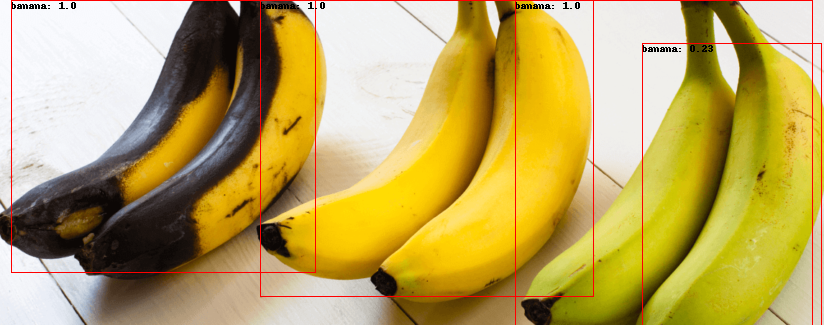

In [37]:
iou_threshold = 0.2

image, labels = test[25]
pred = frcnn(image.unsqueeze(0).to(device))[0]

image = T.ToPILImage()(image)
draw = ImageDraw.Draw(image)
for box, label, score in zip(pred['boxes'], pred["labels"], pred["scores"]):
    score = round(float(score.cpu().detach().numpy()),2)
    draw.text((box[0], box[1]), f"{classes[int(label.cpu().numpy())]}: {str(score)}", fill='black')
    draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
print('F-RCNN:', len(pred["labels"]))
image

In [169]:
evaluate_sample(    # predicted by last model - frcnn
    {'boxes': pred['boxes'].cpu().detach(), 'labels': torch.as_tensor([1 if int(c) in correct_inds else 0 for c in pred["labels"]]), 'scores': pred["scores"].cpu().detach()}, 
    {'boxes': labels['boxes'], 'labels': labels['labels']}, 
    iou_threshold=0.5)

[{'TP': 0, 'score': 0.99832994},
 {'TP': 1, 'score': 0.9971398},
 {'TP': 1, 'score': 0.995826},
 {'TP': 1, 'score': 0.22801755}]

In [32]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [61]:
data_loader_test = torch.utils.data.DataLoader(test, batch_size=16, shuffle=False, num_workers=2, collate_fn=collate_fn)

In [78]:
for model in [frcnn, retina, ssd]:
  print(f'\t', str(model.__class__).split('.')[-1][:-2])
  print(evaluate(model, data_loader_test, device)[0])

	 FasterRCNN
0.6385504514392639
	 RetinaNet


RuntimeError: ignored

Как видно, на данный момент эта клетка выдает ошибку, но у меня сохранились результаты с запуска, когда ошибки не возникло:

FasterRCNN: 0.6385504514392639

RetinaNet: 0.4810873181777438

SSD: 0.58177415330218

### Задание 2.  
  
Обучите детекторы из задания выше на обучающем датасете, оцените качество на тестовом. При необходимости, подберите гиперпараметры - optimizer, lr, weight_decay etc.  
Выполните обучение в двух вариантах: со случайной инициализацией весов и с загрузкой весов уже обученной модели. Сравните качество. 

In [9]:
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn, retinanet_resnet50_fpn, ssd300_vgg16

frcnn_not_trained = fasterrcnn_mobilenet_v3_large_320_fpn(pretrained=False, pretrained_backbone=False)
retina_not_trained = retinanet_resnet50_fpn(pretrained=False, pretrained_backbone=False)
ssd_not_trained = ssd300_vgg16(pretrained=False, pretrained_backbone=False)

frcnn_backboned = fasterrcnn_mobilenet_v3_large_320_fpn(pretrained=False, pretrained_backbone=True, trainable_backbone_layers=0)
retina_backboned = retinanet_resnet50_fpn(pretrained=False, pretrained_backbone=True, trainable_backbone_layers=0, num_classes=2)
ssd_backboned = ssd300_vgg16(pretrained=False, pretrained_backbone=True)

Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth


  0%|          | 0.00/21.1M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/vgg16_features-amdegroot.pth" to /root/.cache/torch/hub/checkpoints/vgg16_features-amdegroot.pth


  0%|          | 0.00/56.1M [00:00<?, ?B/s]

In [10]:
import time

def train_one_epoch(model, optimizer, data_loader, device):
    model.train()
    n = 0
    global_loss = 0
    for images, targets in data_loader:
        images = list(image.to(device).float() for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        dict_loss = model(images, targets)
        losses = sum(loss for loss in dict_loss.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        n += 1
        global_loss += float(losses.cpu().detach().numpy())

        if n % 10 == 0:
            print("Loss value after {} batches is {}".format(n, round(global_loss / n, 2)))

    return global_loss


def train(model, num_epochs, train_loader, test_loader, optimizer, device):
    for epoch in range(num_epochs):
        print("\tEpoch {}/{}..".format(epoch+1, num_epochs))
        start = time.time()
        train_one_epoch(model, optimizer, train_loader, device)
        mAP = evaluate(model, test_loader, device=device)[0]
        end = time.time()

        print("epoch {} done in {}s".format(epoch+1, round(end - start, 2)))
        print("mAP after epoch {} is: {}".format(epoch+1, round(mAP, 3)))


In [11]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [16]:
data_loader_test = torch.utils.data.DataLoader(test, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)

In [17]:
data_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)

#### Training FasterRCNN backboned model

In [20]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def get_detection_model(model=frcnn_backboned, num_classes=2):
    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [75]:
frcnn_backboned = get_detection_model()

In [76]:
len([p for p in frcnn_backboned.parameters() if p.requires_grad])

22

In [80]:
num_epochs = 4

model = frcnn_backboned
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
    
train(model, num_epochs, data_loader, data_loader_test, optimizer, device)

	Epoch 1/4..
Loss value after 10 batches is 0.61
Loss value after 20 batches is 0.62
Loss value after 30 batches is 0.6
epoch 1 done in 18.7s
mAP after epoch 1 is: 0.576
	Epoch 2/4..
Loss value after 10 batches is 0.44
Loss value after 20 batches is 0.48
Loss value after 30 batches is 0.48
epoch 2 done in 18.2s
mAP after epoch 2 is: 0.627
	Epoch 3/4..
Loss value after 10 batches is 0.44
Loss value after 20 batches is 0.49
Loss value after 30 batches is 0.49
epoch 3 done in 17.04s
mAP after epoch 3 is: 0.675
	Epoch 4/4..
Loss value after 10 batches is 0.47
Loss value after 20 batches is 0.5
Loss value after 30 batches is 0.5
epoch 4 done in 15.86s
mAP after epoch 4 is: 0.684


In [81]:
model.eval()
evaluate(model, data_loader_test, device)

(0.6836276462276166, 0.5678195650333248, 0.657118437118436)

#### Training FasterRCNN not backboned model

In [21]:
frcnn_not_trained = get_detection_model(model=frcnn_not_trained)

In [22]:
len([p for p in frcnn_not_trained.parameters() if p.requires_grad])

100

In [25]:
num_epochs = 5

model = frcnn_not_trained
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
    
train(model, num_epochs, data_loader, data_loader_test, optimizer, device)

	Epoch 1/5..
Loss value after 10 batches is 1.36
Loss value after 20 batches is 1.37
Loss value after 30 batches is 1.36
epoch 1 done in 23.92s
mAP after epoch 1 is: 0.019
	Epoch 2/5..
Loss value after 10 batches is 1.34
Loss value after 20 batches is 1.34
Loss value after 30 batches is 1.33
epoch 2 done in 23.76s
mAP after epoch 2 is: 0.018
	Epoch 3/5..
Loss value after 10 batches is 1.29
Loss value after 20 batches is 1.3
Loss value after 30 batches is 1.29
epoch 3 done in 23.85s
mAP after epoch 3 is: 0.02
	Epoch 4/5..
Loss value after 10 batches is 1.27
Loss value after 20 batches is 1.28
Loss value after 30 batches is 1.27
epoch 4 done in 23.89s
mAP after epoch 4 is: 0.021
	Epoch 5/5..
Loss value after 10 batches is 1.25
Loss value after 20 batches is 1.26
Loss value after 30 batches is 1.25
epoch 5 done in 23.87s
mAP after epoch 5 is: 0.019


In [26]:
model.eval()
evaluate(model, data_loader_test, device)

(0.01930550550403916, 0.031237248053642818, 0.2619992482927958)

29


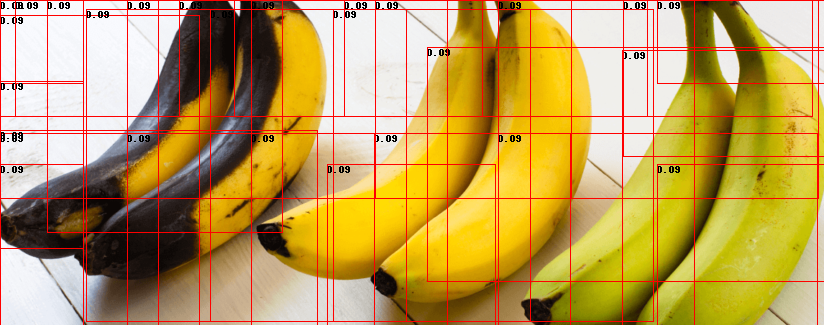

In [38]:
iou_threshold = 0.2

image, labels = test[25]
pred = model(image.unsqueeze(0).to(device))[0]

image = T.ToPILImage()(image)
draw = ImageDraw.Draw(image)
for box, label, score in zip(pred['boxes'], pred["labels"], pred["scores"]):
    score = round(float(score.cpu().detach().numpy()),2)
    draw.text((box[0], box[1]), f"{str(score)}", fill='black')
    draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
print(len(pred["labels"]))
image

#### Training RetinaNet backboned model

In [39]:
import math

In [40]:
def get_retina_detection_model(model, num_classes=2, out_channels = 256):
   
    # replace classification layer 
    in_features = model.head.classification_head.conv[0].in_channels
    num_anchors = model.head.classification_head.num_anchors
    model.head.classification_head.num_classes = num_classes
    
    print('num_classes', num_classes, 'num_ancors', num_anchors)
    cls_logits = torch.nn.Conv2d(out_channels, num_anchors * num_classes, kernel_size = 3, stride=1, padding=1)
    torch.nn.init.normal_(cls_logits.weight, std=0.01)  # as per pytorch code
    torch.nn.init.constant_(cls_logits.bias, -math.log((1 - 0.01) / 0.01))  # as per pytorcch code 
    # assign cls head to model
    model.head.classification_head.cls_logits = cls_logits
    return model

In [41]:
retina_backboned = get_retina_detection_model(retina_backboned)

num_classes 2 num_ancors 9


In [42]:
num_epochs = 4

model = retina_backboned
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.05, momentum=0.9, weight_decay=0.0005)
    
train(model, num_epochs, data_loader, data_loader_test, optimizer, device)

	Epoch 1/4..
Loss value after 10 batches is 1.8
Loss value after 20 batches is 557.87
Loss value after 30 batches is nan
epoch 1 done in 149.97s
mAP after epoch 1 is: 0.0
	Epoch 2/4..
Loss value after 10 batches is nan
Loss value after 20 batches is nan
Loss value after 30 batches is nan
epoch 2 done in 144.55s
mAP after epoch 2 is: 0.0
	Epoch 3/4..
Loss value after 10 batches is nan
Loss value after 20 batches is nan
Loss value after 30 batches is nan
epoch 3 done in 144.43s
mAP after epoch 3 is: 0.0
	Epoch 4/4..
Loss value after 10 batches is nan
Loss value after 20 batches is nan
Loss value after 30 batches is nan
epoch 4 done in 144.29s
mAP after epoch 4 is: 0.0


In [43]:
model.eval()
evaluate(model, data_loader_test, device)

(0.0, 0.0, 0.0)

#### Training SSD model

In [ ]:
ssd_backboned

In [44]:
import math

In [57]:
ssd_backboned = get_ssd_detection_model(ssd_backboned)

num_classes 2


In [ ]:
num_epochs = 4

model = ssd_backboned
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
    
train(model, num_epochs, data_loader, data_loader_test, optimizer, device)

In [ ]:
model.eval()
evaluate(model, data_loader_test, device)

#### Выводы: Обучить другие модели, кроме FRCNN не удалось, а среди FRCNN версия с backbone обучилась значительно лучше, ее и будем использовать в качестве лучшей модели.

### Задание 3.  
  
- Для лучшей модели оцените, как меняется качество на тестовых данных при изменении порога IoU.  
- Также добавьте порог для минимального значения score у предсказанных bounding box'ов, таким образом отсеивая предсказания с низким конфиденсом. Оцените, как меняется качество при изменении порога (порог IoU используйте 0.5). 

In [82]:
model = frcnn_backboned

In [ ]:
# Для этого в подготовленную функцию evaluate я добавлю возможность менять порог IoU

for iou in [0.3, 0.4, 0.5, 0.6, 0.7, 0.8]:
  print(f'Results with {iou} IoU:')
  aucc, precision, recall = evaluate(model, data_loader_test, device, iou)
  print(f'Auc: {aucc};\tPrecision: {precision};\tRecall:{recall}\n')

Results with 0.3 IoU:
Auc: 0.7838411298002066;	Precision: 0.6189807667763934;	Recall:0.7189703720315954

Results with 0.4 IoU:
Auc: 0.7300961631299709;	Precision: 0.5945231931544677;	Recall:0.6807704766888428

Results with 0.5 IoU:
Auc: 0.682003724385205;	Precision: 0.5709101951673161;	Recall:0.645361441279807

Results with 0.6 IoU:
Auc: 0.5861011203156138;	Precision: 0.5279759499414333;	Recall:0.584386135406544

Results with 0.7 IoU:
Auc: 0.2682794401683644;	Precision: 0.3562872907857204;	Recall:0.38022974757668576

Results with 0.8 IoU:
Auc: 0.047187109885745135;	Precision: 0.14562613118302;	Recall:0.15421992973013338



Очевидно, что при низком пороге пересечения будет увеличиваться AUC, но это не практично. Здесь порог 0.5 является хорошим решением, но также порог 0.6 дает неплохие результаты относительно следующего шага (0.7)

In [ ]:
for score_tres in [0.3, 0.4, 0.5, 0.6, 0.7, 0.8]:
  print(f'Results with {score_tres} treshold:')
  aucc, precision, recall = evaluate(model, data_loader_test, device, score_threshold=score_tres)
  print(f'Auc: {aucc};\tPrecision: {precision};\tRecall:{recall}\n')

Results with 0.3 treshold:
Auc: 0.5966039764634621;	Precision: 0.5344953505251333;	Recall:0.5679399965114279

Results with 0.4 treshold:
Auc: 0.578773909646478;	Precision: 0.5243052516461923;	Recall:0.5502728563953023

Results with 0.5 treshold:
Auc: 0.5275237043583152;	Precision: 0.4935938303962521;	Recall:0.500186887941988

Results with 0.6 treshold:
Auc: 0.4536298915306706;	Precision: 0.4469521897571908;	Recall:0.4319354115272475

Results with 0.7 treshold:
Auc: 0.37304952119631085;	Precision: 0.3924410600171099;	Recall:0.3595724003887283

Results with 0.8 treshold:
Auc: 0.26495726495726496;	Precision: 0.310358757714979;	Recall:0.26111983254840326



Здесь также чем ниже степень уверенности (порог), тем лучше AUC. Здесь пороги 0.4 и 0.5 показывают хорошие результаты.

### Задание 4.  
  
Нарисуйте предсказанные bounding box'ы для любых двух картинок из __тестового__ датасета и каких-нибудь картинок из __интернета__ (релевантных - где есть эти фрукты - и тех, где этих фруктов нет).

In [72]:
import random

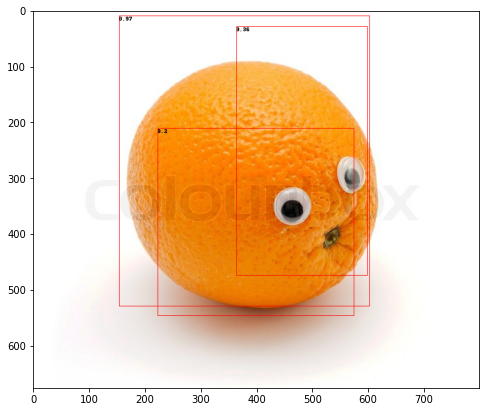

[{'score': 0.9672561, 'TP': 1}, {'score': 0.36126316, 'TP': 0}, {'score': 0.19641793, 'TP': 0}]


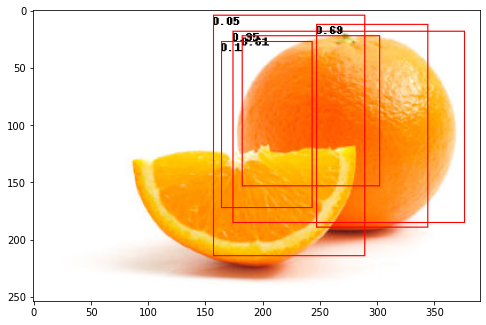

[{'score': 0.94525653, 'TP': 1}, {'score': 0.68987286, 'TP': 0}, {'score': 0.6054016, 'TP': 0}, {'score': 0.09581923, 'TP': 0}, {'score': 0.053437356, 'TP': 0}]


In [73]:
random_indexes = random.sample(list(range(len(test))), 2)

for ind in random_indexes:
  image, labels = test[ind]
  pred = model(image.unsqueeze(0).to(device))[0]
  
  image = T.ToPILImage()(image)
  draw = ImageDraw.Draw(image)
  for box, label, score in zip(pred['boxes'], pred["labels"], pred["scores"]):
      score = round(float(score.cpu().detach().numpy()),2)
      draw.text((box[0], box[1]), f"{str(score)}", fill='black')
      draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
  plt.figure(figsize=(8, 8))
  plt.imshow(image)
  plt.show()
  print(evaluate_sample({'boxes': pred['boxes'].cpu().detach(), "labels": pred["labels"].cpu().detach(), "scores": pred["scores"].cpu().detach()}, labels))

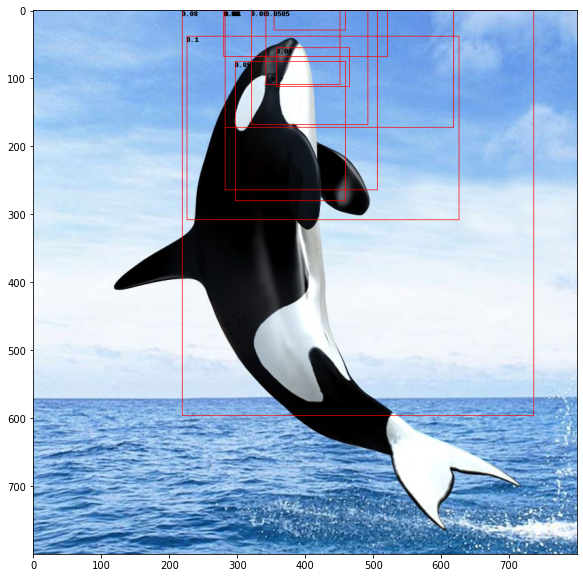

Predicted objects:  10


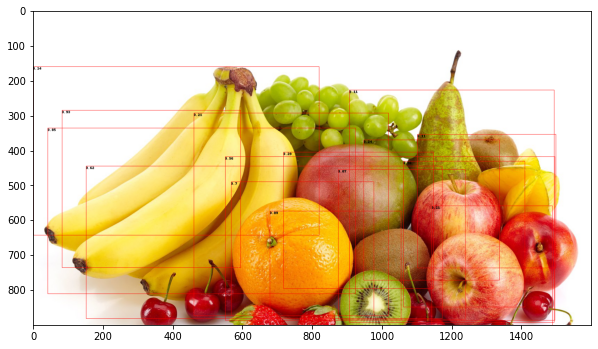

Predicted objects:  15


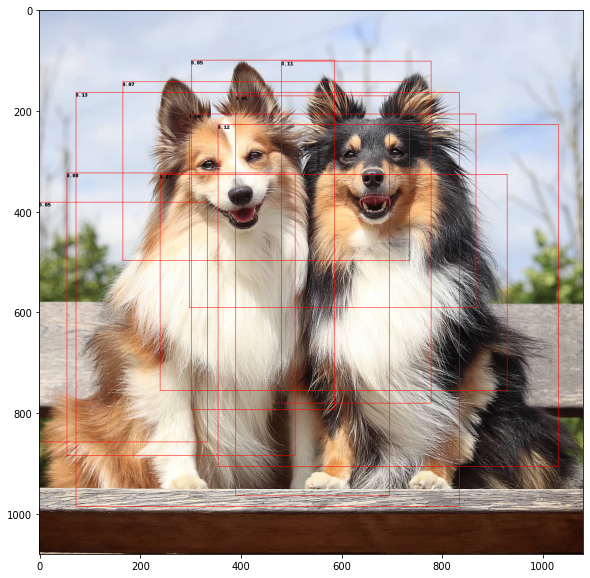

Predicted objects:  10


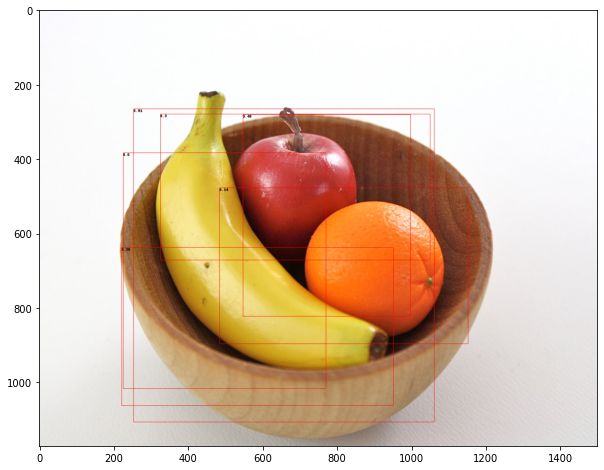

Predicted objects:  6


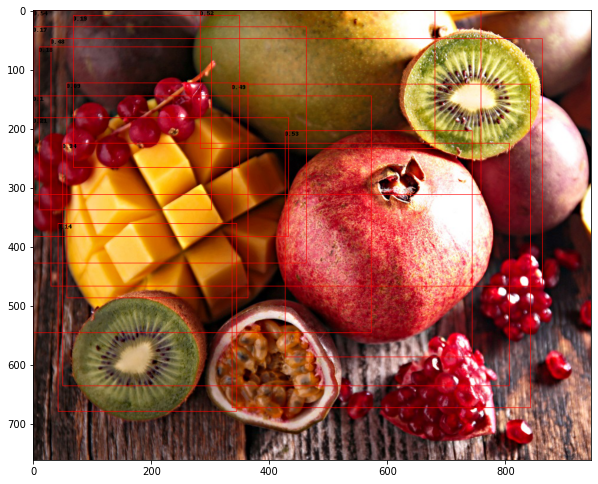

Predicted objects:  13


In [76]:
from urllib.request import urlopen
import requests
from PIL import Image

urls = [
        "https://i.pinimg.com/originals/ca/43/33/ca43330426f2a7bf06807278bf374c30.jpg",   # касатка
        "https://trikky.ru/wp-content/blogs.dir/1/files/2017/03/ZnIedkIVvXHfmSw-1600x900-noPad.jpg",    # много фруктов
        'https://lapkins.ru/upload/uf/f79/f795e55cc07bda34c64a596af9ac28e1.jpg',           # собаки
        'https://4.bp.blogspot.com/-AdkfIq2KNfk/UMIl9O8evCI/AAAAAAAAFi8/JkHNj0Y52c0/s1600/il_fullxfull.308608632.jpg',    # банан, яблоко, апельсин
        'https://puzzleit.ru/files/puzzles/160/159533/_original.jpg'            # фрукты, которых нет в датасете
        ]          
for url in urls:
  image =  Image.open(urlopen(url))
  convert_tensor = T.ToTensor() 
  image = convert_tensor(image)

  pred = model(image.unsqueeze(0).to(device))[0]
  
  image = T.ToPILImage()(image)
  draw = ImageDraw.Draw(image)
  for box, label, score in zip(pred['boxes'], pred["labels"], pred["scores"]):
      score = round(float(score.cpu().detach().numpy()),2)
      draw.text((box[0], box[1]), f"{str(score)}", fill='black')
      draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
  plt.figure(figsize=(10, 10))
  plt.imshow(image)
  plt.show()
  print('Predicted objects: ', len(pred["labels"]))

Модель предсказывает много лишних боксов и задевает большую площадь, чем нужно в картинках из интернета, и меньшую зачастую в тестовых картинках.

### Задание 5.  
  
Реализуйте и примените Non-maximum Suppression. Оцените (визуально и по метрикам), как его использование влияет на качество детекции.   
**NB:** Чтобы продемонстрировать эффективность применения алгоритма, возможно, нужно будет взять достаточно низкий порог конфиденса. 

In [73]:
from torchvision.ops import nms

In [78]:
def evaluate_nms(model, test_loader, device, iou_threshold=0.3, score_threshold=0):
    results = []
    model.eval()
    nbr_boxes = 0
    with torch.no_grad():
        for batch, (images, targets_true) in enumerate(test_loader):
            images = list(image.to(device).float() for image in images)
            targets_pred = model(images)
            
            targets_true = [
                {k: v.cpu().float() for k, v in t.items()} for t in targets_true
            ]
            targets_pred = [
                {k: v.cpu().float() for k, v in t.items()} for t in targets_pred
            ]

            for i in range(len(targets_true)):
                target_true = targets_true[i]
                target_pred = targets_pred[i]
                filtered = nms(target_pred["boxes"].cpu(), target_pred["scores"].cpu(), iou_threshold = iou_threshold).numpy()
                nbr_boxes += target_true["labels"].shape[0]

                results.extend(evaluate_sample(
                    {
                        'boxes': target_pred['boxes'][filtered],  #.detach()
                        'labels': target_pred["labels"][filtered], 
                        'scores': target_pred["scores"][filtered]},
                     target_true, iou_threshold, score_threshold))

    results = sorted(results, key=lambda k: k["score"], reverse=True)

    acc_TP = np.zeros(len(results))
    acc_FP = np.zeros(len(results))
    recall = np.zeros(len(results))
    precision = np.zeros(len(results))

    if results[0]["TP"] == 1:
        acc_TP[0] = 1
    else:
        acc_FP[0] = 1

    for i in range(1, len(results)):
        acc_TP[i] = results[i]["TP"] + acc_TP[i - 1]
        acc_FP[i] = (1 - results[i]["TP"]) + acc_FP[i - 1]

        precision[i] = acc_TP[i] / (acc_TP[i] + acc_FP[i])
        recall[i] = acc_TP[i] / nbr_boxes

    return auc(recall, precision)

In [79]:
for iou in [0.2, 0.3, 0.4]:
  print(f'IoU: {iou}')
  print(evaluate_nms(model, data_loader_test, device, iou_threshold=iou), '\n')

IoU: 0.2
0.7362507990981144 

IoU: 0.3
0.7739107655331402 

IoU: 0.4
0.7643435902340006 



Как видно, порог 0.3 дает лучшие результаты на 8% (0.68 без nms)

Посмотрим как модель справится на тех же рандомных картинках

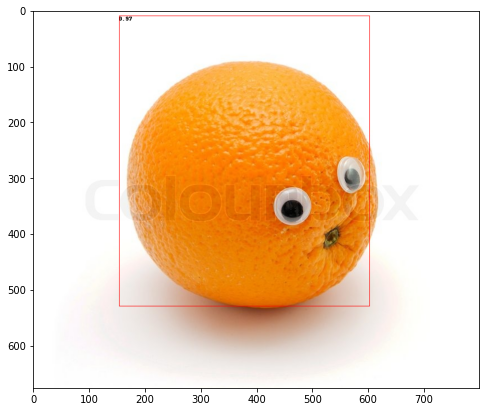

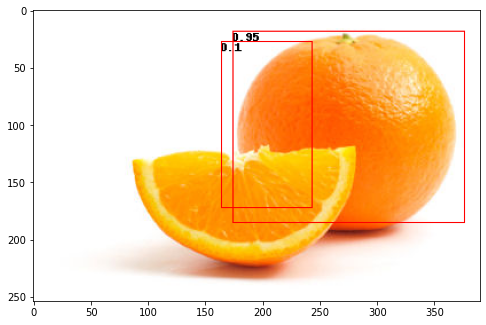

In [81]:
for ind in random_indexes:
  image, labels = test[ind]
  pred = model(image.unsqueeze(0).to(device))[0]
  filtered = nms(pred["boxes"].cpu(), pred["scores"].cpu(), iou_threshold = 0.3).numpy()
  
  image = T.ToPILImage()(image)
  draw = ImageDraw.Draw(image)
  for box, label, score in zip(pred['boxes'][filtered], pred["labels"][filtered], pred["scores"][filtered]):
      score = round(float(score.cpu().detach().numpy()),2)
      draw.text((box[0], box[1]), f"{str(score)}", fill='black')
      draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
  plt.figure(figsize=(8, 8))
  plt.imshow(image)
  plt.show()

In [69]:
urls = [
        "https://i.pinimg.com/originals/ca/43/33/ca43330426f2a7bf06807278bf374c30.jpg",   # касатка
        "https://trikky.ru/wp-content/blogs.dir/1/files/2017/03/ZnIedkIVvXHfmSw-1600x900-noPad.jpg",    # много фруктов
        'https://lapkins.ru/upload/uf/f79/f795e55cc07bda34c64a596af9ac28e1.jpg',           # собаки
        'https://4.bp.blogspot.com/-AdkfIq2KNfk/UMIl9O8evCI/AAAAAAAAFi8/JkHNj0Y52c0/s1600/il_fullxfull.308608632.jpg',    # банан, яблоко, апельсин
        'https://puzzleit.ru/files/puzzles/160/159533/_original.jpg'            # фрукты, которых нет в датасете
        ]  

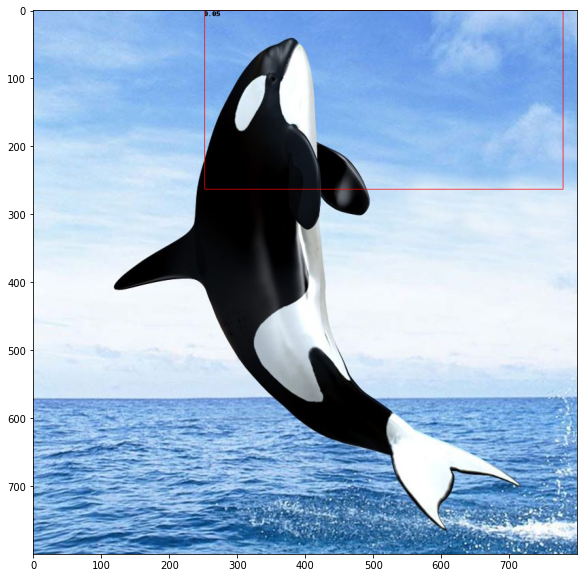

Predicted objects:  1


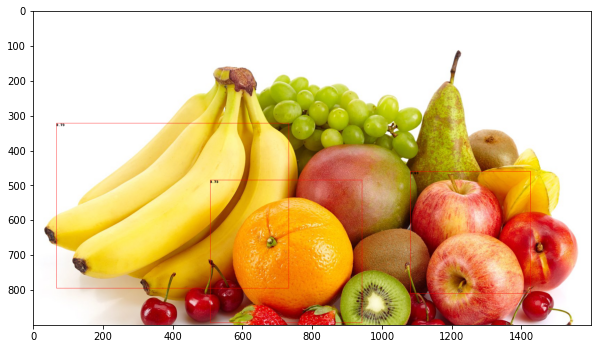

Predicted objects:  14


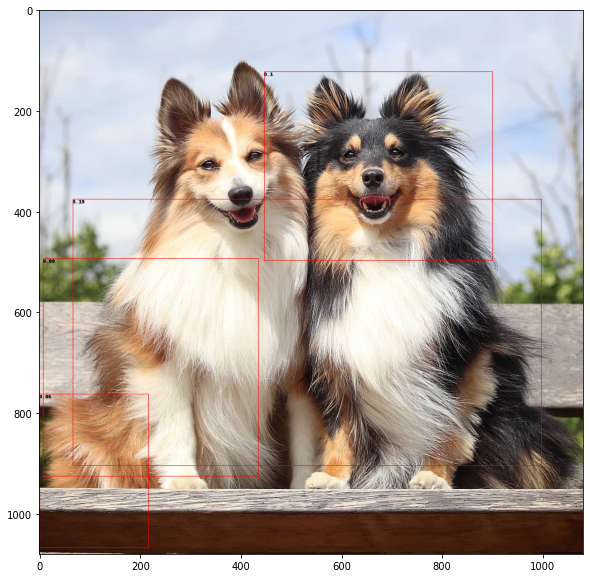

Predicted objects:  16


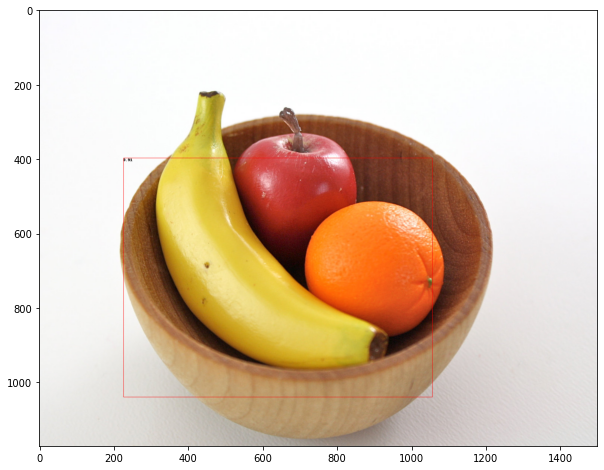

Predicted objects:  6


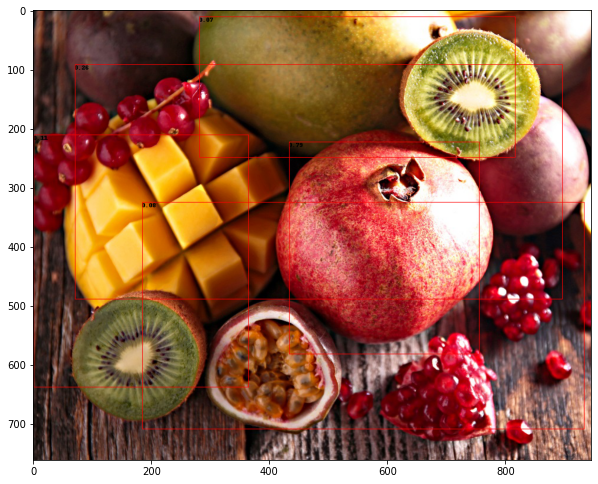

Predicted objects:  14


In [83]:
from urllib.request import urlopen
import requests
from PIL import Image
        
for url in urls:
  image =  Image.open(urlopen(url))
  convert_tensor = T.ToTensor() 
  image = convert_tensor(image)

  pred = model(image.unsqueeze(0).to(device))[0]
  filtered = nms(pred["boxes"].cpu(), pred["scores"].cpu(), iou_threshold = 0.3).numpy()
  
  image = T.ToPILImage()(image)
  draw = ImageDraw.Draw(image)
  for box, label, score in zip(pred['boxes'][filtered], pred["labels"][filtered], pred["scores"][filtered]):
      score = round(float(score.cpu().detach().numpy()),2)
      draw.text((box[0], box[1]), f"{str(score)}", fill='black')
      draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
  plt.figure(figsize=(10, 10))
  plt.imshow(image)
  plt.show()
  print('Predicted objects: ', len(pred["labels"]))

Видно, что в большинстве случаев NMS дает хорошие результаты, под картинками написано реальное число предсказанных объектов.

<br>  
<br>  
  
## Часть 2.  
  
*Вес в общей оценке - 0.4*  
  
Выполните задания 2-5 из предыдущей части для случая 3-х классов (как в изначальном датасете).

              Для этого снова исправим теги в изначальном датасете

In [82]:
class2tag = {"apple": 1, "orange": 2, "banana": 3}

class FruitDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.images = []
        self.annotations = []
        self.transform = transform
        for annotation in glob.glob(data_dir + "/*xml"):
            image_fname = os.path.splitext(annotation)[0] + ".jpg"
            self.images.append(cv2.cvtColor(cv2.imread(image_fname), cv2.COLOR_BGR2RGB))
            with open(annotation) as f:
                annotation_dict = xmltodict.parse(f.read())
            bboxes = []
            labels = []
            objects = annotation_dict["annotation"]["object"]
            if not isinstance(objects, list):
                objects = [objects]
            for obj in objects:
                bndbox = obj["bndbox"]
                bbox = [bndbox["xmin"], bndbox["ymin"], bndbox["xmax"], bndbox["ymax"]]
                bbox = list(map(int, bbox))
                bboxes.append(torch.tensor(bbox))
                labels.append(class2tag[obj["name"]])
            self.annotations.append(
                {"boxes": torch.stack(bboxes).float(), "labels": torch.tensor(labels)}
            )

    def __getitem__(self, i):
        if self.transform:
            res = self.transform(self.images[i])
            return res, self.annotations[i]
        else:
            return self.images[i], self.annotations[i]

    def __len__(self):
        return len(self.images)

In [146]:
def intersection_over_union(dt_bbox, gt_bbox):
    """
    Intersection over Union between two bboxes
    :param dt_bbox: list or numpy array of size (4,) [x0, y0, x1, y1]
    :param gt_bbox: list or numpy array of size (4,) [x0, y0, x1, y1]
    :return : intersection over union
    """

    intersection_bbox = np.array(
        [
            max(dt_bbox[0], gt_bbox[0]),
            max(dt_bbox[1], gt_bbox[1]),
            min(dt_bbox[2], gt_bbox[2]),
            min(dt_bbox[3], gt_bbox[3]),
        ]
    )

    intersection_area = max(intersection_bbox[2] - intersection_bbox[0], 0) * max(
        intersection_bbox[3] - intersection_bbox[1], 0
    )
    area_dt = (dt_bbox[2] - dt_bbox[0]) * (dt_bbox[3] - dt_bbox[1])
    area_gt = (gt_bbox[2] - gt_bbox[0]) * (gt_bbox[3] - gt_bbox[1])

    union_area = area_dt + area_gt - intersection_area

    iou = intersection_area / union_area
    return iou

def evaluate_sample(target_pred, target_true, iou_threshold=0.5, score_threshold=0):
    gt_bboxes = target_true["boxes"].numpy()
    gt_labels = target_true["labels"].numpy()

    dt_bboxes = target_pred["boxes"].numpy()
    dt_labels = target_pred["labels"].numpy()
    dt_scores = target_pred["scores"].numpy()

    results = []
    for detection_id in range(len(dt_labels)):
        dt_bbox = dt_bboxes[detection_id, :]
        #dt_label = class2tag[true_labels[dt_labels[detection_id]]] if dt_labels[detection_id] in correct_inds else 0
        dt_label = dt_labels[detection_id]
        dt_score = dt_scores[detection_id]

        detection_result_dict = {"score": dt_score}

        max_IoU = 0
        max_gt_id = -1
        for gt_id in range(len(gt_labels)):
            gt_bbox = gt_bboxes[gt_id, :]
            gt_label = gt_labels[gt_id]

            if gt_label != dt_label:
                continue

            if intersection_over_union(dt_bbox, gt_bbox) > max_IoU:
                max_IoU = intersection_over_union(dt_bbox, gt_bbox)
                max_gt_id = gt_id

        if max_gt_id >= 0 and max_IoU >= iou_threshold and dt_score > score_threshold:
            detection_result_dict["TP"] = 1
            gt_labels = np.delete(gt_labels, max_gt_id, axis=0)
            gt_bboxes = np.delete(gt_bboxes, max_gt_id, axis=0)

        else:
            detection_result_dict["TP"] = 0

        results.append(detection_result_dict)

    return results


def evaluate(model, test_loader, device, iou_threshold=0.5, score_threshold=0):
    results = []
    model.eval()
    nbr_boxes = 0
    with torch.no_grad():
        for batch, (images, targets_true) in enumerate(test_loader):
            images = list(image.to(device).float() for image in images)
            targets_pred = model(images)

            targets_true = [
                {k: v.cpu().float() for k, v in t.items()} for t in targets_true
            ]
            targets_pred = [
                {k: v.cpu().float() for k, v in t.items()} for t in targets_pred
            ]

            for i in range(len(targets_true)):
                target_true = targets_true[i]
                target_pred = targets_pred[i]
                nbr_boxes += target_true["labels"].shape[0]

                results.extend(evaluate_sample(target_pred, target_true, iou_threshold, score_threshold))

    results = sorted(results, key=lambda k: k["score"], reverse=True)

    acc_TP = np.zeros(len(results))
    acc_FP = np.zeros(len(results))
    recall = np.zeros(len(results))
    precision = np.zeros(len(results))

    if results[0]["TP"] == 1:
        acc_TP[0] = 1
    else:
        acc_FP[0] = 1

    for i in range(1, len(results)):
        acc_TP[i] = results[i]["TP"] + acc_TP[i - 1]
        acc_FP[i] = (1 - results[i]["TP"]) + acc_FP[i - 1]

        precision[i] = acc_TP[i] / (acc_TP[i] + acc_FP[i])
        recall[i] = acc_TP[i] / nbr_boxes

    return auc(recall, precision), sum(precision)/len(precision), sum(recall)/len(recall)

### Задание 1.  
  
Примените обученные детекторы из [torchvision.models](https://pytorch.org/vision/stable/models.html#object-detection-instance-segmentation-and-person-keypoint-detection) - Faster R-CNN, RetinaNet, SSD (можно только с одним backbone, можно все попробовать) - и оцените качество детекции на тестовом датасете. 

In [84]:
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn, retinanet_resnet50_fpn, ssd300_vgg16

frcnn = fasterrcnn_mobilenet_v3_large_320_fpn(pretrained=True)
retina = retinanet_resnet50_fpn(pretrained=True)
ssd = ssd300_vgg16(pretrained=True)

In [85]:
train_data = FruitDataset('/content/data/train_zip/train', get_transform())
test = FruitDataset('/content/data/test_zip/test', get_transform())

In [ ]:
frcnn.to(device)
frcnn.eval()

retina.to(device)
retina.eval()

ssd.to(device)
ssd.eval()

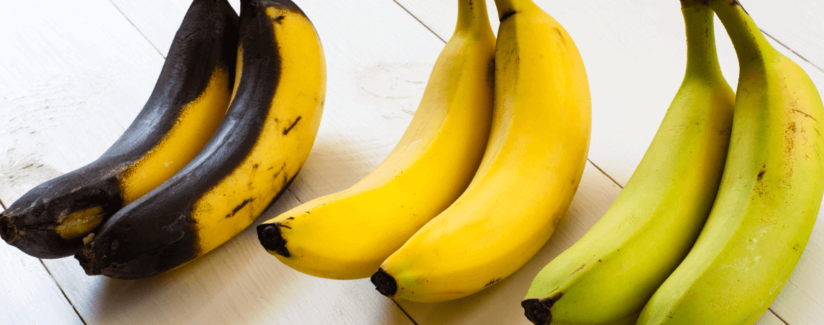

In [87]:
from PIL import ImageDraw

image, labels = test[25]

image = T.ToPILImage()(image)
draw = ImageDraw.Draw(image)
image

In [88]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]
classes = dict(zip(range(len(COCO_INSTANCE_CATEGORY_NAMES)), COCO_INSTANCE_CATEGORY_NAMES))

In [89]:
#print(COCO_INSTANCE_CATEGORY_NAMES.index('banana'), COCO_INSTANCE_CATEGORY_NAMES.index('apple'), COCO_INSTANCE_CATEGORY_NAMES.index('orange'))
correct_inds = [COCO_INSTANCE_CATEGORY_NAMES.index('banana'), COCO_INSTANCE_CATEGORY_NAMES.index('apple'), COCO_INSTANCE_CATEGORY_NAMES.index('orange')]
correct_inds

[52, 53, 55]

In [126]:
true_labels = {
               COCO_INSTANCE_CATEGORY_NAMES.index('orange'): 'orange',
               COCO_INSTANCE_CATEGORY_NAMES.index('banana'): 'banana',
               COCO_INSTANCE_CATEGORY_NAMES.index('apple'): 'apple'
               }
classes_true = {1: 'apple', 2: 'orange', 3: 'banana'}

Ground Truth


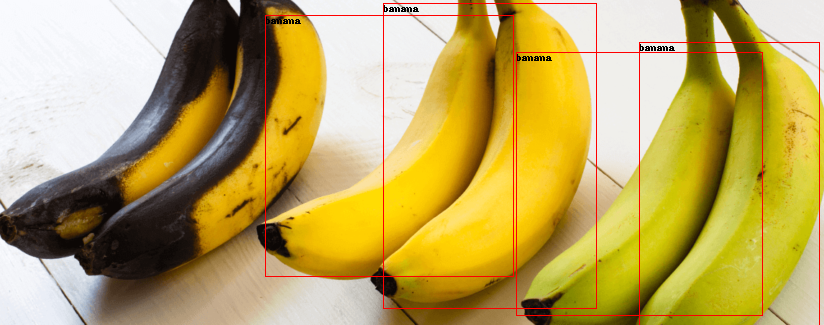

In [93]:
image, labels = test[25]

image = T.ToPILImage()(image)
draw = ImageDraw.Draw(image)
box = labels['boxes']
label = labels['labels']
for i in range(len(labels['labels'])):
  draw.text((int(box[i][0]), int(box[i][1])), 
            f"{classes_true[int(label[i].numpy())]}", 
            fill='black')
  draw.rectangle([(box[i][0], box[i][1]), (box[i][2], box[i][3])], outline='red')
print('Ground Truth')
image

60


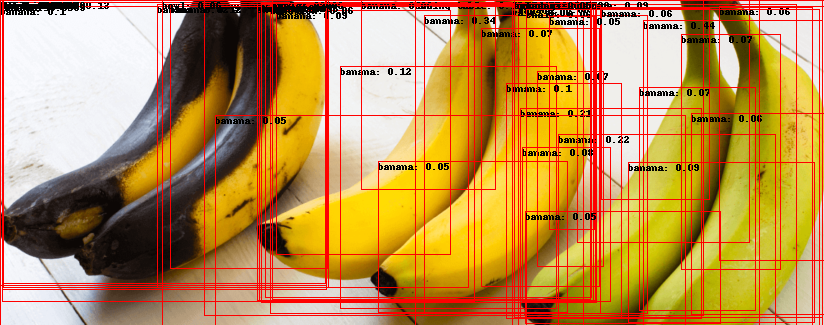

In [94]:
iou_threshold = 0.2

image, labels = test[25]
pred = retina(image.unsqueeze(0).to(device))[0]

image = T.ToPILImage()(image)
draw = ImageDraw.Draw(image)
for box, label, score in zip(pred['boxes'], pred["labels"], pred["scores"]):
    score = round(float(score.cpu().detach().numpy()),2)
    draw.text((box[0], box[1]), f"{classes[int(label.cpu().numpy())]}: {str(score)}", fill='black')
    draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
print(len(pred["labels"]))
image

200


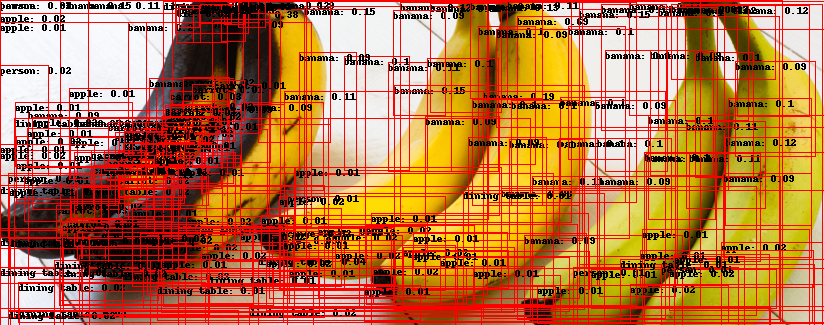

In [95]:
iou_threshold = 0.2

image, labels = test[25]
pred = ssd(image.unsqueeze(0).to(device))[0]

image = T.ToPILImage()(image)
draw = ImageDraw.Draw(image)
for box, label, score in zip(pred['boxes'], pred["labels"], pred["scores"]):
    score = round(float(score.cpu().detach().numpy()),2)
    draw.text((box[0], box[1]), f"{classes[int(label.cpu().numpy())]}: {str(score)}", fill='black')
    draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
print(len(pred["labels"]))
image

4


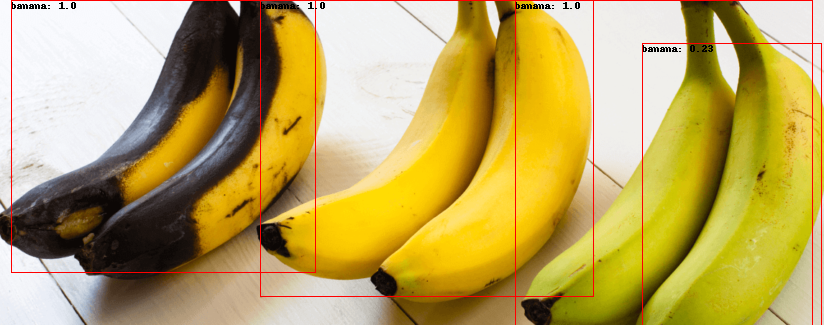

In [96]:
iou_threshold = 0.2

image, labels = test[25]
pred = frcnn(image.unsqueeze(0).to(device))[0]

image = T.ToPILImage()(image)
draw = ImageDraw.Draw(image)
for box, label, score in zip(pred['boxes'], pred["labels"], pred["scores"]):
    score = round(float(score.cpu().detach().numpy()),2)
    draw.text((box[0], box[1]), f"{classes[int(label.cpu().numpy())]}: {str(score)}", fill='black')
    draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
print(len(pred["labels"]))
image

In [97]:
evaluate_sample(    # predicted by last model - frcnn
    {'boxes': pred['boxes'].cpu().detach(), 'labels': torch.as_tensor([1 if int(c) in correct_inds else 0 for c in pred["labels"]]), 'scores': pred["scores"].cpu().detach()}, 
    {'boxes': labels['boxes'], 'labels': torch.as_tensor([1 for _ in range(len(labels['labels']))])}, 
    iou_threshold=0.5)

[{'TP': 0, 'score': 0.99832994},
 {'TP': 1, 'score': 0.9971398},
 {'TP': 1, 'score': 0.995826},
 {'TP': 1, 'score': 0.22801755}]

In [98]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [100]:
data_loader_test = torch.utils.data.DataLoader(test, batch_size=16, shuffle=False, num_workers=2, collate_fn=collate_fn)

In [145]:
for model in [frcnn, retina, ssd]:
  print(f'\t', str(model.__class__).split('.')[-1][:-2])
  print(evaluate(model, data_loader_test, device)[0])

	 FasterRCNN
0.643451641172798
	 RetinaNet
0.5034129914368313
	 SSD
0.5752539509532136


### Задание 2.  
  
Обучите детекторы из задания выше на обучающем датасете, оцените качество на тестовом. При необходимости, подберите гиперпараметры - optimizer, lr, weight_decay etc.  
Выполните обучение в двух вариантах: со случайной инициализацией весов и с загрузкой весов уже обученной модели. Сравните качество. 

In [116]:
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn, retinanet_resnet50_fpn, ssd300_vgg16

frcnn_not_trained = fasterrcnn_mobilenet_v3_large_320_fpn(pretrained=False, pretrained_backbone=False)
retina_not_trained = retinanet_resnet50_fpn(pretrained=False, pretrained_backbone=False)
ssd_not_trained = ssd300_vgg16(pretrained=False, pretrained_backbone=False)

frcnn_backboned = fasterrcnn_mobilenet_v3_large_320_fpn(pretrained=False, pretrained_backbone=True, trainable_backbone_layers=0)
retina_backboned = retinanet_resnet50_fpn(pretrained=False, pretrained_backbone=True, trainable_backbone_layers=0, num_classes=2)
ssd_backboned = ssd300_vgg16(pretrained=False, pretrained_backbone=True)

In [107]:
import time

def train_one_epoch(model, optimizer, data_loader, device):
    model.train()
    n = 0
    global_loss = 0
    for images, targets in data_loader:
        images = list(image.to(device).float() for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        dict_loss = model(images, targets)
        losses = sum(loss for loss in dict_loss.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        n += 1
        global_loss += float(losses.cpu().detach().numpy())

        if n % 10 == 0:
            print("Loss value after {} batches is {}".format(n, round(global_loss / n, 2)))

    return global_loss


def train(model, num_epochs, train_loader, test_loader, optimizer, device):
    for epoch in range(num_epochs):
        print("\tEpoch {}/{}..".format(epoch+1, num_epochs))
        start = time.time()
        train_one_epoch(model, optimizer, train_loader, device)
        mAP = evaluate(model, test_loader, device=device)[0]
        end = time.time()

        print("epoch {} done in {}s".format(epoch+1, round(end - start, 2)))
        print("mAP after epoch {} is: {}".format(epoch+1, round(mAP, 3)))


In [108]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [109]:
data_loader_test = torch.utils.data.DataLoader(test, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)

In [110]:
data_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)

#### Training FasterRCNN backboned model

In [111]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def get_detection_model(model=frcnn_backboned, num_classes=4):
    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [117]:
frcnn_backboned = get_detection_model()

In [113]:
len([p for p in frcnn_backboned.parameters() if p.requires_grad])

22

In [118]:
num_epochs = 4

model = frcnn_backboned
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
    
train(model, num_epochs, data_loader, data_loader_test, optimizer, device)

	Epoch 1/4..
Loss value after 10 batches is 0.92
Loss value after 20 batches is 0.82
Loss value after 30 batches is 0.77
epoch 1 done in 21.5s
mAP after epoch 1 is: 0.448
	Epoch 2/4..
Loss value after 10 batches is 0.56
Loss value after 20 batches is 0.59
Loss value after 30 batches is 0.59
epoch 2 done in 19.98s
mAP after epoch 2 is: 0.569
	Epoch 3/4..
Loss value after 10 batches is 0.56
Loss value after 20 batches is 0.59
Loss value after 30 batches is 0.58
epoch 3 done in 18.59s
mAP after epoch 3 is: 0.608
	Epoch 4/4..
Loss value after 10 batches is 0.55
Loss value after 20 batches is 0.59
Loss value after 30 batches is 0.58
epoch 4 done in 18.02s
mAP after epoch 4 is: 0.661


In [119]:
model.eval()
evaluate(model, data_loader_test, device)

(0.6612509125573622, 0.495381348994792, 0.6787191303320359)

#### Training FasterRCNN not backboned model

In [ ]:
frcnn_not_trained = get_detection_model(model=frcnn_not_trained)

In [ ]:
len([p for p in frcnn_not_trained.parameters() if p.requires_grad])

100

In [ ]:
num_epochs = 4

model = frcnn_not_trained
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
    
train(model, num_epochs, data_loader, data_loader_test, optimizer, device)

	Epoch 1/4..


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Loss value after 10 batches is 1.71
Loss value after 20 batches is 1.66
Loss value after 30 batches is 1.6
epoch 0 done in 551.3s
mAP after epoch 0 is: 0.015
	Epoch 2/4..
Loss value after 10 batches is 1.44
Loss value after 20 batches is 1.41
Loss value after 30 batches is 1.39
epoch 1 done in 558.03s
mAP after epoch 1 is: 0.017
	Epoch 3/4..
Loss value after 10 batches is 1.36
Loss value after 20 batches is 1.35
Loss value after 30 batches is 1.33
epoch 2 done in 557.71s
mAP after epoch 2 is: 0.018
	Epoch 4/4..
Loss value after 10 batches is 1.32
Loss value after 20 batches is 1.3
Loss value after 30 batches is 1.29
epoch 3 done in 563.03s
mAP after epoch 3 is: 0.016


In [ ]:
model.eval()
evaluate(model, data_loader_test, device)

0.015927015977395764

#### Training RetinaNet backboned model

In [ ]:
import math

In [ ]:
def get_retina_detection_model(model, num_classes=4, out_channels = 256):
   
    # replace classification layer 
    in_features = model.head.classification_head.conv[0].in_channels
    num_anchors = model.head.classification_head.num_anchors
    model.head.classification_head.num_classes = num_classes
    
    print('num_classes', num_classes, 'num_ancors', num_anchors)
    cls_logits = torch.nn.Conv2d(out_channels, num_anchors * num_classes, kernel_size = 3, stride=1, padding=1)
    torch.nn.init.normal_(cls_logits.weight, std=0.01)  # as per pytorch code
    torch.nn.init.constant_(cls_logits.bias, -math.log((1 - 0.01) / 0.01))  # as per pytorcch code 
    # assign cls head to model
    model.head.classification_head.cls_logits = cls_logits
    return model

In [ ]:
retina_backboned = get_retina_detection_model(retina_backboned)

num_classes 2 num_ancors 9


In [ ]:
num_epochs = 4

model = retina_backboned
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
    
train(model, num_epochs, data_loader, data_loader_test, optimizer, device)

	Epoch 1/4..
Loss value after 10 batches is 1.76


RuntimeError: ignored

In [ ]:
model.eval()
evaluate(model, data_loader_test, device)

Как и в прошлый раз, FasterRCNN backboned дает лучшие результаты, хоть и немного хуже, чем при определении 1 класса (0.66 и 0.68).

### Задание 3.  
  
- Для лучшей модели оцените, как меняется качество на тестовых данных при изменении порога IoU.  
- Также добавьте порог для минимального значения score у предсказанных bounding box'ов, таким образом отсеивая предсказания с низким конфиденсом. Оцените, как меняется качество при изменении порога (порог IoU используйте 0.5). 

In [120]:
model = frcnn_backboned

In [121]:
# Для этого в подготовленную функцию evaluate я добавлю возможность менять порог IoU

for iou in [0.3, 0.4, 0.5, 0.6, 0.7, 0.8]:
  print(f'Results with {iou} IoU:')
  aucc, precision, recall = evaluate(model, data_loader_test, device, iou)
  print(f'Auc: {aucc};\tPrecision: {precision};\tRecall:{recall}\n')

Results with 0.3 IoU:
Auc: 0.7511626223805512;	Precision: 0.5343543480897521;	Recall:0.7441608570640824

Results with 0.4 IoU:
Auc: 0.7071770999086477;	Precision: 0.5170999587206943;	Recall:0.7146008113750059

Results with 0.5 IoU:
Auc: 0.6612509125573622;	Precision: 0.495381348994792;	Recall:0.6787191303320359

Results with 0.6 IoU:
Auc: 0.4883734059273851;	Precision: 0.42250495668765004;	Recall:0.5662294694552743

Results with 0.7 IoU:
Auc: 0.33942325781868476;	Precision: 0.34197456752618277;	Recall:0.430087833313638

Results with 0.8 IoU:
Auc: 0.13973549707581323;	Precision: 0.20746987913787357;	Recall:0.2379573831186719



Аналогичная ситуация как в прошлой части, только все значения немного ниже. И если раньше (в первой части) мы могли выбрать 0.6 порог, то здесь этого может быть уже недостаточно и стоит предпочесть 0.5.

In [122]:
for score_tres in [0.3, 0.4, 0.5, 0.6, 0.7, 0.8]:
  print(f'Results with {score_tres} treshold:')
  aucc, precision, recall = evaluate(model, data_loader_test, device, score_threshold=score_tres)
  print(f'Auc: {aucc};\tPrecision: {precision};\tRecall:{recall}\n')

Results with 0.3 treshold:
Auc: 0.6052894399523291;	Precision: 0.4744701957071618;	Recall:0.6228681712552655

Results with 0.4 treshold:
Auc: 0.5911768097503199;	Precision: 0.4670302066252205;	Recall:0.6059513962739754

Results with 0.5 treshold:
Auc: 0.5579873306044697;	Precision: 0.4491261175555576;	Recall:0.5686911654653621

Results with 0.6 treshold:
Auc: 0.5208770230520512;	Precision: 0.42855917362916085;	Recall:0.5289692386466622

Results with 0.7 treshold:
Auc: 0.4591371231532842;	Precision: 0.39322230024332655;	Recall:0.4659892079246888

Results with 0.8 treshold:
Auc: 0.35181579961424025;	Precision: 0.32554068211163845;	Recall:0.3558233880814538



Аналогично части 1, порог 0.3 дает лучшие результаты, но более практичным стал бы выбрать порог 0.5 или 0.6

### Задание 4.  
  
Нарисуйте предсказанные bounding box'ы для любых двух картинок из __тестового__ датасета и каких-нибудь картинок из __интернета__ (релевантных - где есть эти фрукты - и тех, где этих фруктов нет).

In [123]:
import random

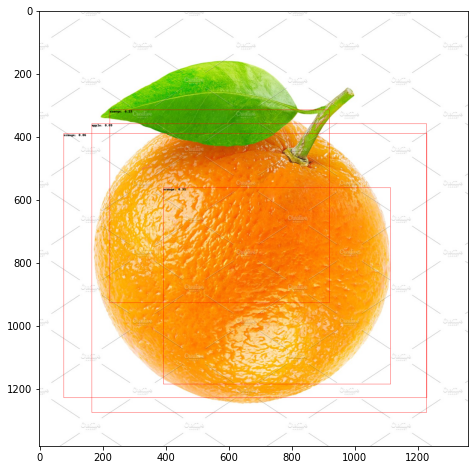

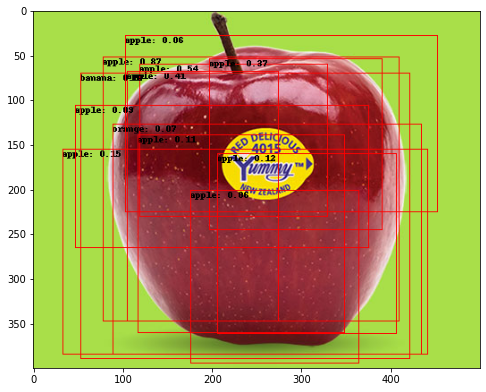

In [131]:
random_indexes = random.sample(list(range(len(test))), 2)

for ind in random_indexes:
  image, labels = test[ind]
  pred = model(image.unsqueeze(0).to(device))[0]
  
  image = T.ToPILImage()(image)
  draw = ImageDraw.Draw(image)
  for box, label, score in zip(pred['boxes'], pred["labels"], pred["scores"]):
      score = round(float(score.cpu().detach().numpy()),2)
      draw.text((box[0], box[1]), f"{classes_true[int(label.cpu().numpy())]}: {str(score)}", fill='black')
      draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
  plt.figure(figsize=(8, 8))
  plt.imshow(image)
  plt.show()

В первом случае 1/4 предсказаний оказалось яблоко, остальные 3 апельсин, что правильно. Во втором виднеются по одному ответу banana и orange, но уверенность в них мала.

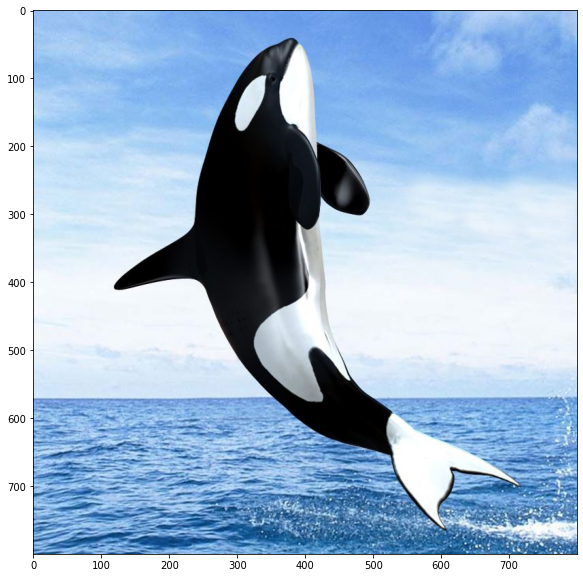

Predicted objects:  0


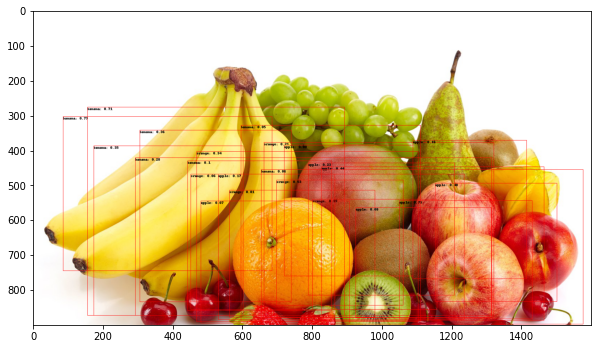

Predicted objects:  23


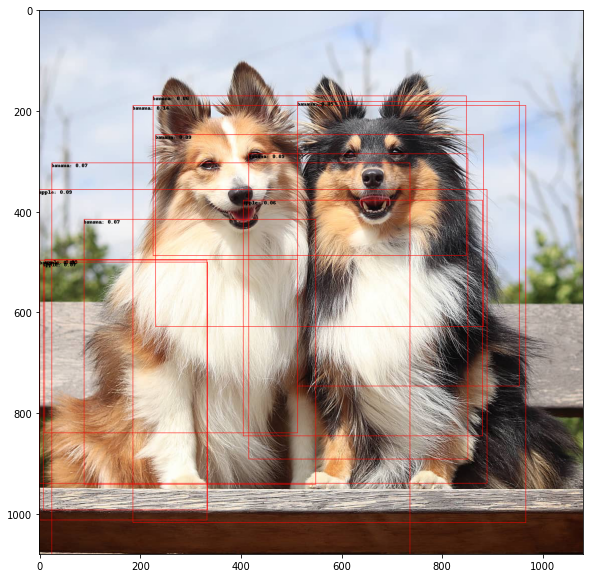

Predicted objects:  12


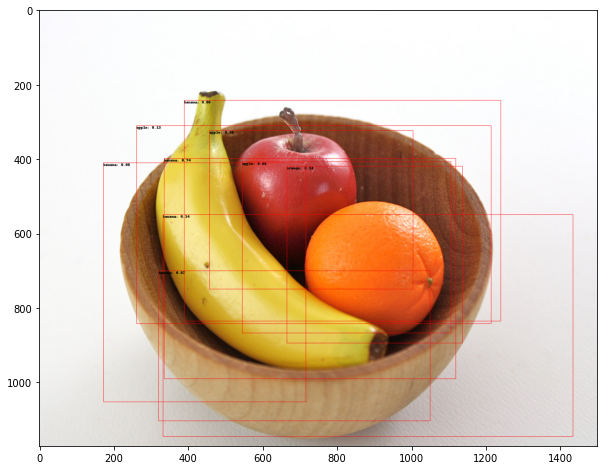

Predicted objects:  9


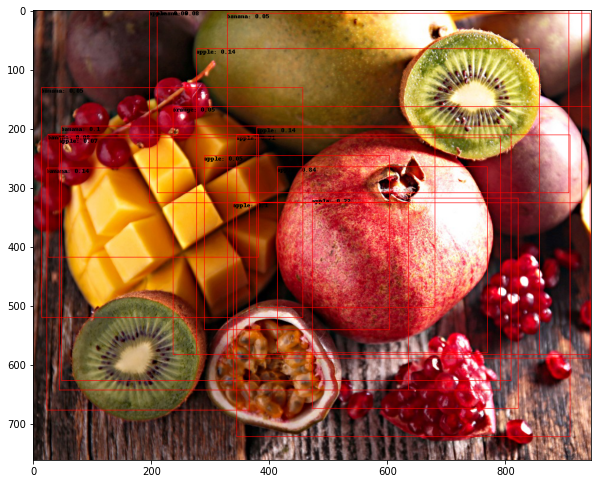

Predicted objects:  16


In [134]:
from urllib.request import urlopen
import requests
from PIL import Image 

urls = [
        "https://i.pinimg.com/originals/ca/43/33/ca43330426f2a7bf06807278bf374c30.jpg",   # касатка
        "https://trikky.ru/wp-content/blogs.dir/1/files/2017/03/ZnIedkIVvXHfmSw-1600x900-noPad.jpg",    # много фруктов
        'https://lapkins.ru/upload/uf/f79/f795e55cc07bda34c64a596af9ac28e1.jpg',           # собаки
        'https://4.bp.blogspot.com/-AdkfIq2KNfk/UMIl9O8evCI/AAAAAAAAFi8/JkHNj0Y52c0/s1600/il_fullxfull.308608632.jpg',    # банан, яблоко, апельсин
        'https://puzzleit.ru/files/puzzles/160/159533/_original.jpg'            # фрукты, которых нет в датасете
        ]          
for url in urls:
  image =  Image.open(urlopen(url))
  convert_tensor = T.ToTensor() 
  image = convert_tensor(image)

  pred = model(image.unsqueeze(0).to(device))[0]
  
  image = T.ToPILImage()(image)
  draw = ImageDraw.Draw(image)
  for box, label, score in zip(pred['boxes'], pred["labels"], pred["scores"]):
      score = round(float(score.cpu().detach().numpy()),2)
      draw.text((box[0], box[1]), f"{classes_true[int(label.cpu().numpy())]}: {str(score)}", fill='black')
      draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
  plt.figure(figsize=(10, 10))
  plt.imshow(image)
  plt.show()
  print('Predicted objects: ', len(pred["labels"]))

Стоит отметить, что на касатке модель не нашла объектов, и это уже неплохой результат. В собаках модель в основном увидела бананы и пару яблок, а на последней наоборот - много яблок и несколько бананов.

Картинки с фруктами в целом дают удовлетворительные результаты, в областях фруктов правильные ответы.

### Задание 5.  
  
Реализуйте и примените Non-maximum Suppression. Оцените (визуально и по метрикам), как его использование влияет на качество детекции.   
**NB:** Чтобы продемонстрировать эффективность применения алгоритма, возможно, нужно будет взять достаточно низкий порог конфиденса. 

In [135]:
from torchvision.ops import nms

In [136]:
def evaluate_nms(model, test_loader, device, iou_threshold=0.3, score_threshold=0):
    results = []
    model.eval()
    nbr_boxes = 0
    with torch.no_grad():
        for batch, (images, targets_true) in enumerate(test_loader):
            images = list(image.to(device).float() for image in images)
            targets_pred = model(images)
            
            targets_true = [
                {k: v.cpu().float() for k, v in t.items()} for t in targets_true
            ]
            targets_pred = [
                {k: v.cpu().float() for k, v in t.items()} for t in targets_pred
            ]

            for i in range(len(targets_true)):
                target_true = targets_true[i]
                target_pred = targets_pred[i]
                filtered = nms(target_pred["boxes"].cpu(), target_pred["scores"].cpu(), iou_threshold = iou_threshold).numpy()
                nbr_boxes += target_true["labels"].shape[0]

                results.extend(evaluate_sample(
                    {
                        'boxes': target_pred['boxes'][filtered],  #.detach()
                        'labels': target_pred["labels"][filtered], 
                        'scores': target_pred["scores"][filtered]},
                     target_true, iou_threshold, score_threshold))

    results = sorted(results, key=lambda k: k["score"], reverse=True)

    acc_TP = np.zeros(len(results))
    acc_FP = np.zeros(len(results))
    recall = np.zeros(len(results))
    precision = np.zeros(len(results))

    if results[0]["TP"] == 1:
        acc_TP[0] = 1
    else:
        acc_FP[0] = 1

    for i in range(1, len(results)):
        acc_TP[i] = results[i]["TP"] + acc_TP[i - 1]
        acc_FP[i] = (1 - results[i]["TP"]) + acc_FP[i - 1]

        precision[i] = acc_TP[i] / (acc_TP[i] + acc_FP[i])
        recall[i] = acc_TP[i] / nbr_boxes

    return auc(recall, precision)

In [137]:
for iou in [0.2, 0.3, 0.4]:
  print(f'IoU: {iou}')
  print(evaluate_nms(model, data_loader_test, device, iou_threshold=iou), '\n')

IoU: 0.2
0.7317079345173163 

IoU: 0.3
0.7324755065237917 

IoU: 0.4
0.7137495353204604 



Посмотрим как модель справится на тех же рандомных картинках

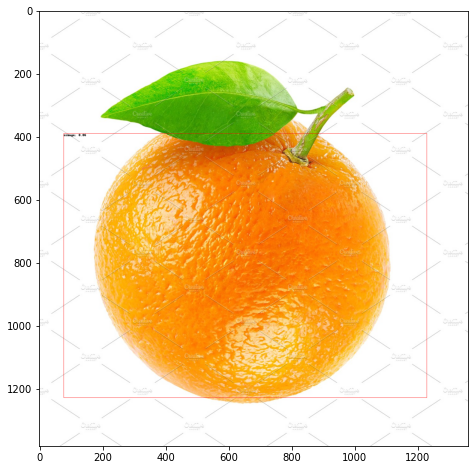

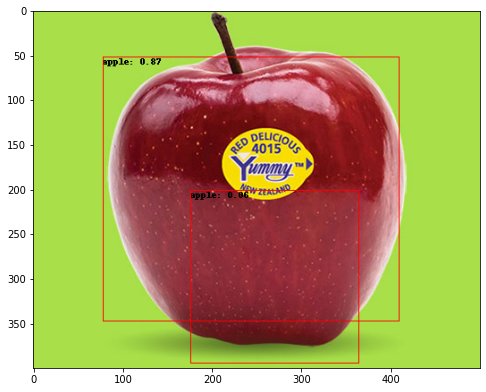

In [139]:
for ind in random_indexes:
  image, labels = test[ind]
  pred = model(image.unsqueeze(0).to(device))[0]
  filtered = nms(pred["boxes"].cpu(), pred["scores"].cpu(), iou_threshold = 0.3).numpy()
  
  image = T.ToPILImage()(image)
  draw = ImageDraw.Draw(image)
  for box, label, score in zip(pred['boxes'][filtered], pred["labels"][filtered], pred["scores"][filtered]):
      score = round(float(score.cpu().detach().numpy()),2)
      draw.text((box[0], box[1]), f"{classes_true[int(label.cpu().numpy())]}: {str(score)}", fill='black')
      draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline='red')
  plt.figure(figsize=(8, 8))
  plt.imshow(image)
  plt.show()

Ответы стали значительно лучше, объект определяется правильно.

<br>  
<br>  
  
## Часть 3.  
  
*Вес в общей оценке - 0.2*  
  
Обучите модель для object detection для трех классов на __обучающем__ датасете и добейтесь PR AUC не менее __0.91__ на  __тестовом__.  
Баллы за задание вычисляются по формуле: __min(2, 2 * Ваш auc / 0.91)__.

In [148]:
evaluate(model=frcnn_backboned, test_loader=data_loader_test, device=device, iou_threshold=0.1)[0]

# model: frcnn_backboned
# iou_threshold = 0.1
# method: ordinary

0.8270693805996402

In [149]:
print('Балл: ', min(2, 2 * 0.8270693805996402 / 0.91))

Балл:  1.8177349024167915


In [140]:
evaluate_nms(model=frcnn_backboned, test_loader=data_loader_test, device=device, iou_threshold=0.3)

# model: frcnn_backboned
# iou_threshold = 0.3
# method: using NonMaximumSuppression

0.7324755065237917

In [141]:
print('Балл: ', min(2, 2 * 0.7324755065237917 / 0.91))

Балл:  1.6098362780742674


<br>  
<br>  
  
## Бонусные задания.  
  
1. При обучении используйте аугментации (в первую очередь пространственные) из [albumentations](https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/) или [torchvision.transforms](https://pytorch.org/vision/stable/transforms.html).  
2. Возьмите одну из [детекционных архитектур](https://paperswithcode.com/sota/object-detection-on-coco) (желательно, не старее 2020 года), у которой выложены тренировочный код и чекпоинты на гитхабе, обучите и провалидируйте ее на данных этой лабораторной. 